In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from tensorflow import keras
import warnings
warnings.filterwarnings("ignore")
plt.rcParams.update({'figure.figsize':(21,7), 'figure.dpi':120})

In [2]:
data_205 = pd.read_csv('D:\dataset\id_205_2018.csv', parse_dates=['DATA_AS_OF'], index_col='DATA_AS_OF')
data_204 = pd.read_csv('D:\dataset\id_204.csv', parse_dates=['DATA_AS_OF'], index_col='DATA_AS_OF')
data_206 = pd.read_csv('D:\dataset\id_206.csv', parse_dates=['DATA_AS_OF'], index_col='DATA_AS_OF')
data_207 = pd.read_csv('D:\dataset\id_207.csv', parse_dates=['DATA_AS_OF'], index_col='DATA_AS_OF')
data_208 = pd.read_csv('D:\dataset\id_208.csv', parse_dates=['DATA_AS_OF'], index_col='DATA_AS_OF')

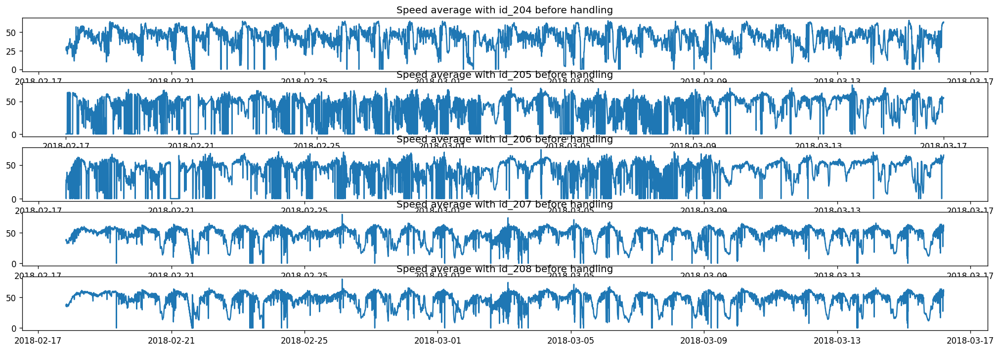

In [3]:
fig, axes = plt.subplots(5)
axes[0].plot(data_204); axes[0].set_title('Speed average with id_204 before handling')
axes[1].plot(data_205); axes[1].set_title('Speed average with id_205 before handling')
axes[2].plot(data_206); axes[2].set_title('Speed average with id_206 before handling')
axes[3].plot(data_207); axes[3].set_title('Speed average with id_207 before handling')
axes[4].plot(data_208); axes[4].set_title('Speed average with id_208 before handling')
#data.plot()
plt.show()

In [4]:
from sklearn.impute import SimpleImputer
x_204 = data_204.iloc[:,:1].values
imputer= SimpleImputer(missing_values = 0, strategy='mean')  
imputerimputer= imputer.fit(x_204[:, 0:1])  
x_204[:, 0:1]= imputer.transform(x_204[:, 0:1])  
x_204
data_204['SPEED'] = x_204

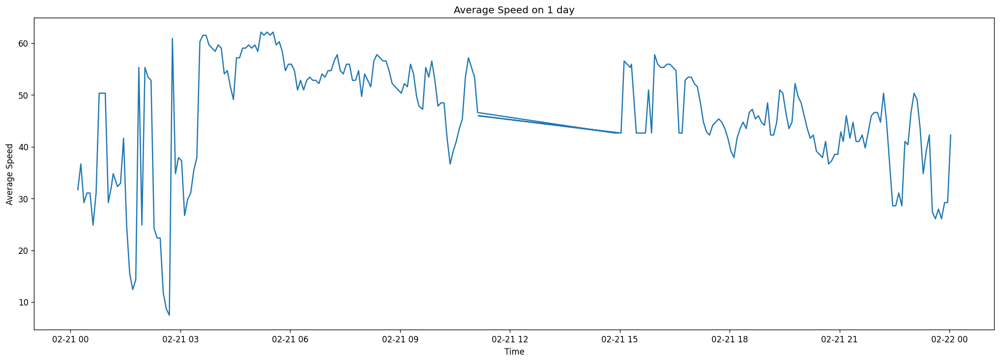

In [5]:
data_1 = data_204[908:1151]
plt.plot(data_1)
plt.xlabel('Time')
plt.ylabel('Average Speed')
plt.title("Average Speed on 1 day")
plt.show()

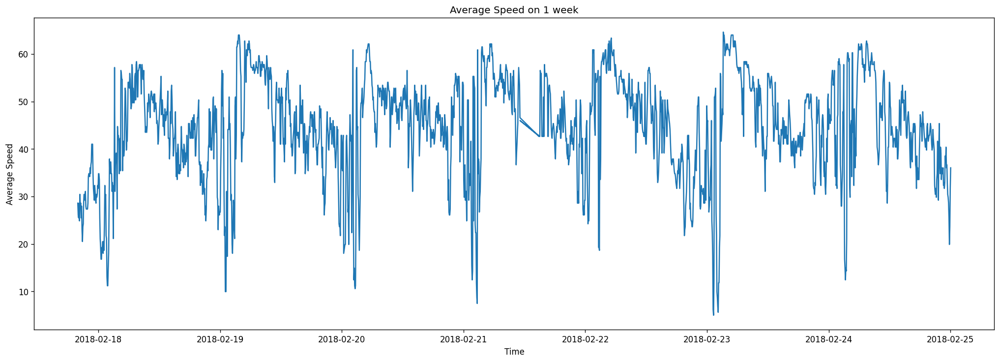

In [6]:
data = data_204[:2015]
plt.plot(data)
plt.xlabel('Time')
plt.ylabel('Average Speed')
plt.title("Average Speed on 1 week")
plt.show()

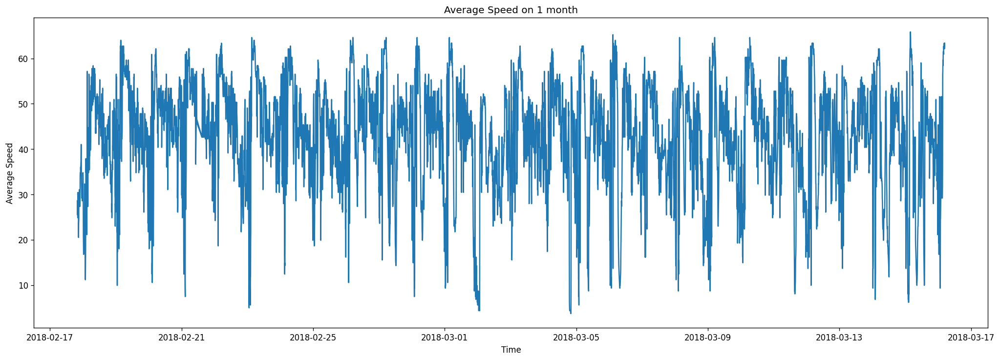

In [7]:
plt.plot(data_204)
plt.xlabel('Time')
plt.ylabel('Average Speed')
plt.title("Average Speed on 1 month")
plt.show()

In [8]:
from sklearn.impute import SimpleImputer
x_205 = data_205.iloc[:,:1].values
imputer= SimpleImputer(missing_values = 0, strategy='mean')  
imputerimputer= imputer.fit(x_205[:, 0:1])  
x_205[:, 0:1]= imputer.transform(x_205[:, 0:1])  
x_205
data_205['SPEED'] = x_205

In [9]:
from sklearn.impute import SimpleImputer
x_206 = data_206.iloc[:,:1].values
imputer= SimpleImputer(missing_values = 0, strategy='mean')  
imputerimputer= imputer.fit(x_206[:, 0:1])  
x_206[:, 0:1]= imputer.transform(x_206[:, 0:1])  
x_206
data_206['SPEED'] = x_206

In [10]:
from sklearn.impute import SimpleImputer
x_207 = data_207.iloc[:,:1].values
imputer= SimpleImputer(missing_values = 0, strategy='mean')  
imputerimputer= imputer.fit(x_207[:, 0:1])  
x_207[:, 0:1]= imputer.transform(x_207[:, 0:1])  
x_207
data_207['SPEED'] = x_207

In [11]:
from sklearn.impute import SimpleImputer
x_208 = data_208.iloc[:,:1].values
imputer= SimpleImputer(missing_values = 0, strategy='mean')  
imputerimputer= imputer.fit(x_208[:, 0:1])  
x_208[:, 0:1]= imputer.transform(x_208[:, 0:1])  
x_208
data_208['SPEED'] = x_208

In [12]:
train_205 = data_205.SPEED[:5389]
#77560 for all
#1587 for 1thang
train_205 = train_205.values.reshape(-1)
test_205 = data_205.SPEED[5389:]
test_205 = test_205.values.reshape(-1)
date_test_205 = data_205.index[5389:].values.reshape(-1)

In [13]:
train_204 = data_204.SPEED[:5389]
#77560 for all
#1587 for 1thang
train_204 = train_204.values.reshape(-1)
test_204 = data_204.SPEED[5389:]
test_204 = test_204.values.reshape(-1)
date_test_204 = data_204.index[5389:].values.reshape(-1)

In [14]:
train_206 = data_206.SPEED[:5389]
#77560 for all
#1587 for 1thang
train_206 = train_206.values.reshape(-1)
test_206 = data_206.SPEED[5389:]
test_206 = test_206.values.reshape(-1)
date_test_206 = data_206.index[5389:].values.reshape(-1)

In [15]:
train_207 = data_207.SPEED[:5389]
#77560 for all
#1587 for 1thang
train_207 = train_207.values.reshape(-1)
test_207 = data_207.SPEED[5389:]
test_207 = test_207.values.reshape(-1)
date_test_207 = data_207.index[5389:].values.reshape(-1)

In [16]:
train_208 = data_208.SPEED[:5389]
#77560 for all
#1587 for 1thang
train_208 = train_208.values.reshape(-1)
test_208 = data_208.SPEED[5389:]
test_208 = test_208.values.reshape(-1)
date_test_208 = data_208.index[5389:].values.reshape(-1)

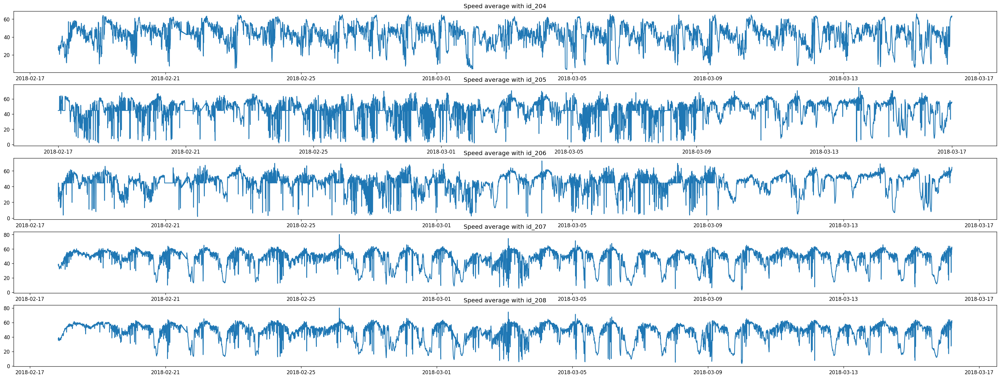

In [17]:
plt.rcParams.update({'figure.figsize':(35,13), 'figure.dpi':120})
fig, axes = plt.subplots(5)
axes[0].plot(data_204); axes[0].set_title('Speed average with id_204')
axes[1].plot(data_205); axes[1].set_title('Speed average with id_205')
axes[2].plot(data_206); axes[2].set_title('Speed average with id_206')
axes[3].plot(data_207); axes[3].set_title('Speed average with id_207')
axes[4].plot(data_208); axes[4].set_title('Speed average with id_208')
#data.plot()
plt.show()

In [18]:
def get_data(train,test,time_step,num_predict,date):
  x_train = list()
  y_train = list()
  x_test = list()
  y_test = list()
  date_test = list()

  for i in range(0,len(train) - time_step - num_predict):
    x_train.append(train[i:i+time_step])
    y_train.append(train[i+time_step:i+time_step+num_predict])

  for i in range(0, len(test) - time_step - num_predict):
    x_test.append(test[i:i+time_step])
    y_test.append(test[i+time_step:i+time_step+num_predict])
    date_test.append(date[i+time_step:i+time_step+num_predict])
  
  return np.asarray(x_train), np.asarray(y_train), np.asarray(x_test), np.asarray(y_test), np.asarray(date_test)

In [19]:
#205
x_train_205, y_train_205, x_test_205, y_test_205, date_test_205 = get_data(train_205,test_205,30,1, date_test_205)

# dua ve 0->1 cho tap train
scaler = MinMaxScaler()
x_train_205 = x_train_205.reshape(-1,30)

x_train_205 = scaler.fit_transform(x_train_205)
y_train_205 = scaler.fit_transform(y_train_205)
# dua ve 0->1 cho tap test
x_test_205 = x_test_205.reshape(-1,30)

x_test_205 = scaler.fit_transform(x_test_205)
y_test_205 = scaler.fit_transform(y_test_205)

In [20]:
# Reshape lai cho dung model
x_train_205 = x_train_205.reshape(-1,30,1)
y_train_205 = y_train_205.reshape(-1,1)

#reshape lai cho test
x_test_205 = x_test_205.reshape(-1,30,1)
y_test_205 = y_test_205.reshape(-1,1)
date_test_205 = date_test_205.reshape(-1,1)

In [21]:
#204
x_train_204, y_train_204, x_test_204, y_test_204, date_test_204 = get_data(train_204,test_204,30,1, date_test_204)

# dua ve 0->1 cho tap train
scaler = MinMaxScaler()
x_train_204 = x_train_204.reshape(-1,30)

x_train_204 = scaler.fit_transform(x_train_204)
y_train_204 = scaler.fit_transform(y_train_204)
# dua ve 0->1 cho tap test
x_test_204 = x_test_204.reshape(-1,30)

x_test_204 = scaler.fit_transform(x_test_204)
y_test_204 = scaler.fit_transform(y_test_204)

In [22]:
# Reshape lai cho dung model
#204
x_train_204 = x_train_204.reshape(-1,30,1)
y_train_204 = y_train_204.reshape(-1,1)

#reshape lai cho test
x_test_204 = x_test_204.reshape(-1,30,1)
y_test_204 = y_test_204.reshape(-1,1)
date_test_204 = date_test_204.reshape(-1,1)

In [23]:
#206
x_train_206, y_train_206, x_test_206, y_test_206, date_test_206 = get_data(train_206,test_206,30,1, date_test_206)

# dua ve 0->1 cho tap train
scaler = MinMaxScaler()
x_train_206 = x_train_206.reshape(-1,30)

x_train_206 = scaler.fit_transform(x_train_206)
y_train_206 = scaler.fit_transform(y_train_206)
# dua ve 0->1 cho tap test
x_test_206 = x_test_206.reshape(-1,30)

x_test_206 = scaler.fit_transform(x_test_206)
y_test_206 = scaler.fit_transform(y_test_206)

In [24]:
# Reshape lai cho dung model
#206
x_train_206 = x_train_206.reshape(-1,30,1)
y_train_206 = y_train_206.reshape(-1,1)

#reshape lai cho test
x_test_206 = x_test_206.reshape(-1,30,1)
y_test_206 = y_test_206.reshape(-1,1)
date_test_206 = date_test_206.reshape(-1,1)

In [25]:
#207
x_train_207, y_train_207, x_test_207, y_test_207, date_test_207 = get_data(train_207,test_207,30,1, date_test_207)

# dua ve 0->1 cho tap train
scaler = MinMaxScaler()
x_train_204 = x_train_207.reshape(-1,30)

x_train_207 = scaler.fit_transform(x_train_207)
y_train_207 = scaler.fit_transform(y_train_207)
# dua ve 0->1 cho tap test
x_test_207 = x_test_207.reshape(-1,30)

x_test_207 = scaler.fit_transform(x_test_207)
y_test_207 = scaler.fit_transform(y_test_207)

In [26]:
# Reshape lai cho dung model
#207
x_train_207 = x_train_207.reshape(-1,30,1)
y_train_207 = y_train_207.reshape(-1,1)

#reshape lai cho test
x_test_207 = x_test_207.reshape(-1,30,1)
y_test_207 = y_test_207.reshape(-1,1)
date_test_207 = date_test_207.reshape(-1,1)

In [27]:
#208
x_train_208, y_train_208, x_test_208, y_test_208, date_test_208 = get_data(train_208,test_208,30,1, date_test_208)

# dua ve 0->1 cho tap train
scaler = MinMaxScaler()
x_train_208 = x_train_208.reshape(-1,30)

x_train_208 = scaler.fit_transform(x_train_208)
y_train_208 = scaler.fit_transform(y_train_208)
# dua ve 0->1 cho tap test
x_test_208 = x_test_208.reshape(-1,30)

x_test_208 = scaler.fit_transform(x_test_208)
y_test_208 = scaler.fit_transform(y_test_208)

In [28]:
# Reshape lai cho dung model
#208
x_train_208 = x_train_208.reshape(-1,30,1)
y_train_208 = y_train_208.reshape(-1,1)

#reshape lai cho test
x_test_208 = x_test_208.reshape(-1,30,1)
y_test_208 = y_test_208.reshape(-1,1)
date_test_208 = date_test_208.reshape(-1,1)

In [29]:
#dau vao 30 doan 1
n_input = 30
n_features = 1

model = Sequential()
model.add(LSTM(units=50,activation='relu', input_shape=(n_input, n_features), return_sequences=True))
model.add(Dropout(0.3))

model.add(LSTM(units=50, return_sequences=True))
model.add(Dropout(0.3))

model.add(LSTM(units=50))
model.add(Dropout(0.3))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [30]:
model.fit(x_train_205, y_train_205, epochs=20, validation_split=0.2, verbose=1, batch_size=1)
model.save('D:\Prediction\lstm-test')

Epoch 1/20
4286/4286 [==============================] - 63s 14ms/step - loss: 0.0375 - val_loss: 0.0341
Epoch 2/20
4286/4286 [==============================] - 59s 14ms/step - loss: 0.0308 - val_loss: 0.0297
Epoch 3/20
4286/4286 [==============================] - 60s 14ms/step - loss: 0.0284 - val_loss: 0.0270
Epoch 4/20
4286/4286 [==============================] - 59s 14ms/step - loss: 0.0262 - val_loss: 0.0259
Epoch 5/20
4286/4286 [==============================] - 60s 14ms/step - loss: 0.0252 - val_loss: 0.0240
Epoch 6/20
4286/4286 [==============================] - 60s 14ms/step - loss: 0.0241 - val_loss: 0.0245
Epoch 7/20
4286/4286 [==============================] - 60s 14ms/step - loss: 0.0238 - val_loss: 0.0237
Epoch 8/20
4286/4286 [==============================] - 60s 14ms/step - loss: 0.0235 - val_loss: 0.0244
Epoch 9/20
4286/4286 [==============================] - 65s 15ms/step - loss: 0.0237 - val_loss: 0.0252
Epoch 10/20
4286/4286 [==============================] - 69s 16m

INFO:tensorflow:Assets written to: D:\Prediction\lstm-test\assets


INFO:tensorflow:Assets written to: D:\Prediction\lstm-test\assets


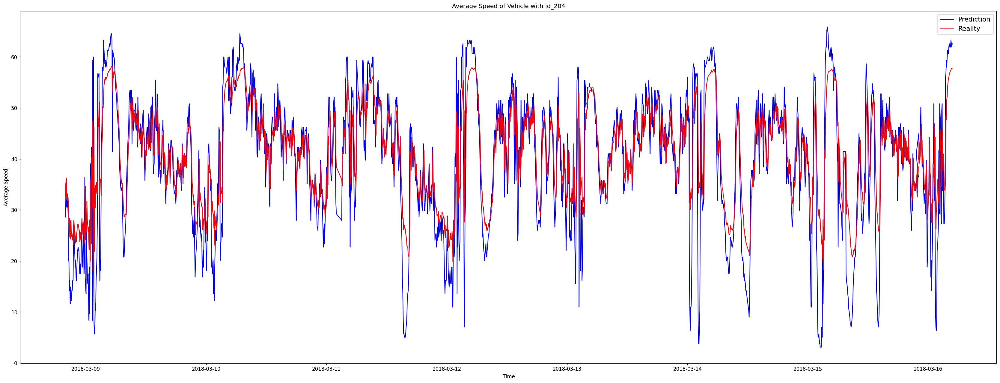

In [31]:
model = keras.models.load_model('D:\Prediction\lstm-test')

test_output_204 = model.predict(x_test_204)

# print(test_output)
test_1_204 = scaler.inverse_transform(test_output_204)
test_2_204 = scaler.inverse_transform(y_test_204)

plt.plot( data_204.index[5420:], test_2_204, color='b')
plt.plot( data_204.index[5420:], test_1_204,  color='r')
#77529 for all

plt.title("Average Speed of Vehicle with id_204")
plt.xlabel("Time")
plt.ylabel("Average Speed")
plt.legend(('Prediction', 'Reality'),loc='upper right', fontsize=13)

plt.show()

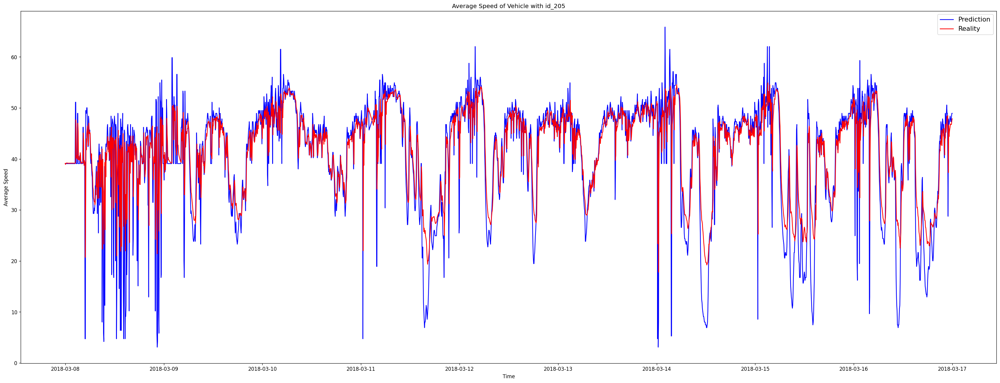

In [32]:
model = keras.models.load_model('D:\Prediction\lstm-test')

test_output_205 = model.predict(x_test_205)

# print(test_output)
test_1_205 = scaler.inverse_transform(test_output_205)
test_2_205 = scaler.inverse_transform(y_test_205)

plt.plot( data_205.index[5420:], test_2_205, color='b')
plt.plot( data_205.index[5420:], test_1_205,  color='r')
#77529 for all

plt.title("Average Speed of Vehicle with id_205")
plt.xlabel("Time")
plt.ylabel("Average Speed")
plt.legend(('Prediction', 'Reality'),loc='upper right', fontsize=13)

plt.show()

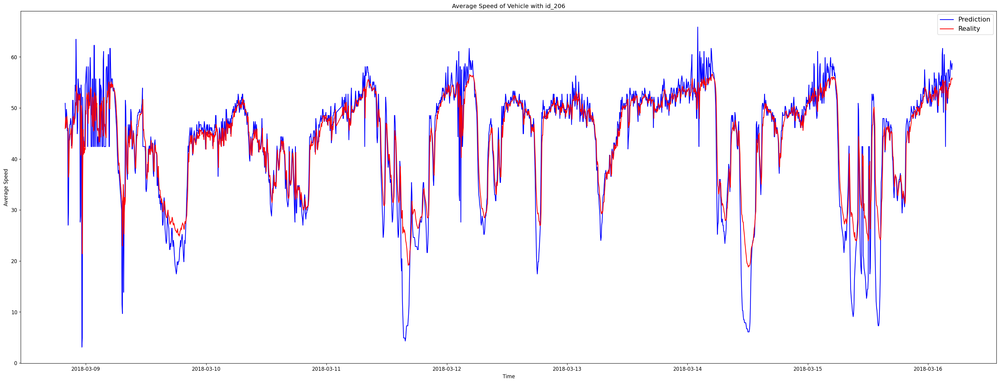

In [33]:
model = keras.models.load_model('D:\Prediction\lstm-test')

test_output_206 = model.predict(x_test_206)

# print(test_output)
test_1_206 = scaler.inverse_transform(test_output_206)
test_2_206 = scaler.inverse_transform(y_test_206)

plt.plot( data_206.index[5420:], test_2_206, color='b')
plt.plot( data_206.index[5420:], test_1_206,  color='r')
#77529 for all

plt.title("Average Speed of Vehicle with id_206")
plt.xlabel("Time")
plt.ylabel("Average Speed")
plt.legend(('Prediction', 'Reality'),loc='upper right', fontsize=13)

plt.show()

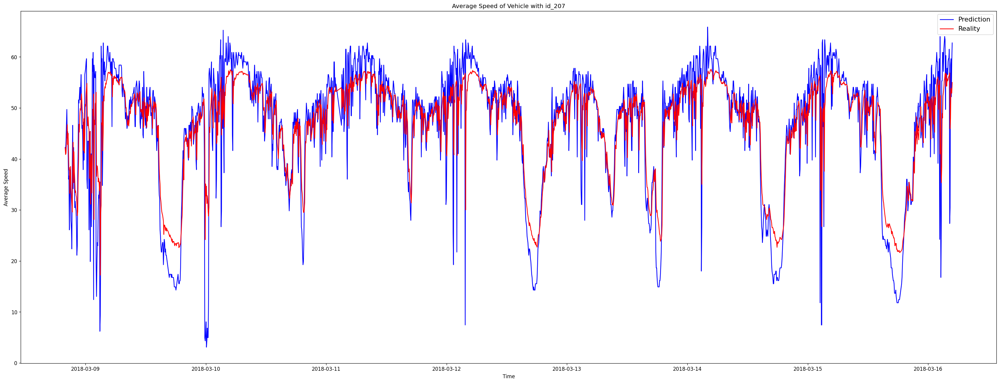

In [34]:
model = keras.models.load_model('D:\Prediction\lstm-test')

test_output_207 = model.predict(x_test_207)

# print(test_output)
test_1_207 = scaler.inverse_transform(test_output_207)
test_2_207 = scaler.inverse_transform(y_test_207)

plt.plot( data_207.index[5420:], test_2_207, color='b')
plt.plot( data_207.index[5420:], test_1_207,  color='r')
#77529 for all

plt.title("Average Speed of Vehicle with id_207")
plt.xlabel("Time")
plt.ylabel("Average Speed")
plt.legend(('Prediction', 'Reality'),loc='upper right', fontsize=13)

plt.show()

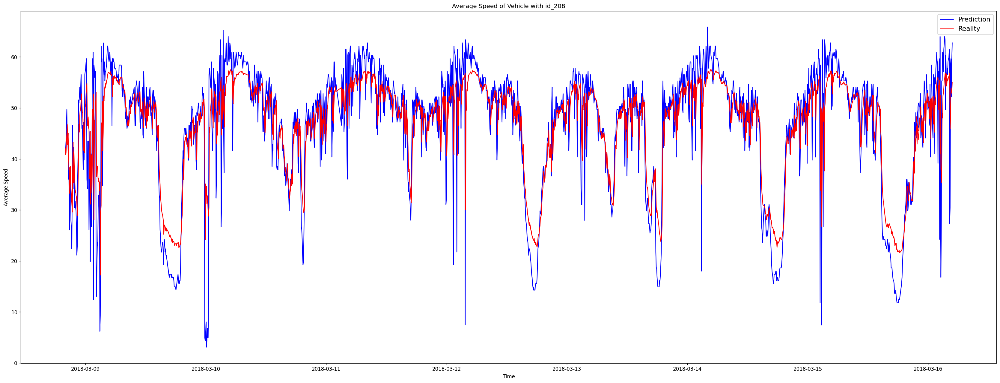

In [35]:
model = keras.models.load_model('D:\Prediction\lstm-test')

test_output_208 = model.predict(x_test_208)

# print(test_output)
test_1_208 = scaler.inverse_transform(test_output_208)
test_2_208 = scaler.inverse_transform(y_test_208)

plt.plot( data_208.index[5420:], test_2_208, color='b')
plt.plot( data_208.index[5420:], test_1_208,  color='r')
#77529 for all

plt.title("Average Speed of Vehicle with id_208")
plt.xlabel("Time")
plt.ylabel("Average Speed")
plt.legend(('Prediction', 'Reality'),loc='upper right', fontsize=13)

plt.show()

In [36]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse = mean_squared_error(test_1_204, test_2_204)
print('Test RMSE 204: %.3f' % rmse)
rms = sqrt(mean_squared_error(test_2_204, test_1_204))
print('Test RMSE 204: %.3f' % rms)

rmse = mean_squared_error(test_1_205, test_2_205)
print('Test RMSE 205: %.3f' % rmse)
rms = sqrt(mean_squared_error(test_2_205, test_1_205))
print('Test RMSE 205: %.3f' % rms)

rmse = mean_squared_error(test_1_206, test_2_206)
print('Test RMSE 206: %.3f' % rmse)
rms = sqrt(mean_squared_error(test_2_206, test_1_206))
print('Test RMSE 206: %.3f' % rms)

rmse = mean_squared_error(test_1_207, test_2_207)
print('Test RMSE 207: %.3f' % rmse)
rms = sqrt(mean_squared_error(test_2_207, test_1_207))
print('Test RMSE 207: %.3f' % rms)

rmse = mean_squared_error(test_1_208, test_2_208)
print('Test RMSE 208: %.3f' % rmse)
rms = sqrt(mean_squared_error(test_2_208, test_1_208))
print('Test RMSE 208: %.3f' % rms)

Test RMSE 204: 53.039
Test RMSE 204: 7.283
Test RMSE 205: 40.696
Test RMSE 205: 6.379
Test RMSE 206: 23.398
Test RMSE 206: 4.837
Test RMSE 207: 40.037
Test RMSE 207: 6.327
Test RMSE 208: 40.029
Test RMSE 208: 6.327


In [37]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 30, 50)            10400     
_________________________________________________________________
dropout (Dropout)            (None, 30, 50)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 30, 50)            20200     
_________________________________________________________________
dropout_1 (Dropout)          (None, 30, 50)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 5

In [98]:
# Accuracy metrics
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    #corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    #acf1 = acf(fc-test)[1]                      # ACF1
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 
            'minmax':minmax})

In [99]:
forecast_accuracy(test_1_204, test_2_204)

{'mape': 0.24229335937223204,
 'me': 1.2060952411491308,
 'mae': 5.0282609517568755,
 'mpe': 0.1652207499445016,
 'rmse': 7.282816344108441,
 'minmax': 0.13069571970769012}

In [100]:
forecast_accuracy(test_1_205, test_2_205)

{'mape': 0.1897387632185937,
 'me': 0.7895150250676721,
 'mae': 3.7394312403959913,
 'mpe': 0.1270134986939527,
 'rmse': 6.379321596713939,
 'minmax': 0.09839937287627243}

In [101]:
forecast_accuracy(test_1_206, test_2_206)

{'mape': 0.13560487210944927,
 'me': 0.5190602537642348,
 'mae': 2.938901011581883,
 'mpe': 0.08622459493033205,
 'rmse': 4.837134864944364,
 'minmax': 0.07796556969007307}

In [102]:
forecast_accuracy(test_1_207, test_2_207)

{'mape': 0.15009805522384403,
 'me': 0.09404974615741642,
 'mae': 4.236370750680424,
 'mpe': 0.07366701515558753,
 'rmse': 6.327442520023187,
 'minmax': 0.09692840870336583}

In [103]:
forecast_accuracy(test_1_208, test_2_208)

{'mape': 0.15008408779839522,
 'me': 0.09405317262543382,
 'mae': 4.235709513411323,
 'mpe': 0.07366496377261299,
 'rmse': 6.326871552305527,
 'minmax': 0.096915879641983}

In [39]:
df_204 = pd.DataFrame(data_204[5420:])
df_204['Prediction_204'] = test_1_204

df_205 = pd.DataFrame(data_205[5420:])
df_205['Prediction_205'] = test_1_205

df_206 = pd.DataFrame(data_206[5420:])
df_206['Prediction_206'] = test_1_206

df_207 = pd.DataFrame(data_207[5420:])
df_207['Prediction_207'] = test_1_207

df_208 = pd.DataFrame(data_208[5420:])
df_208['Prediction_208'] = test_1_208

In [40]:
# import pandas as pd
location_205 = pd.read_csv("D:\dataset\Long_lat_id_205.csv")
location_204 = pd.read_csv("D:\dataset\Long_lat_id_204.csv")
location_206 = pd.read_csv("D:\dataset\Long_lat_id_206.csv")
location_207 = pd.read_csv("D:\dataset\Long_lat_id_207.csv")
location_208 = pd.read_csv("D:\dataset\Long_lat_id_208.csv")

# ARIMA

In [41]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(data_204.SPEED.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -14.346550
p-value: 0.000000


In [42]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(data_205.SPEED.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -10.402407
p-value: 0.000000


In [43]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(data_206.SPEED.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -10.311658
p-value: 0.000000


In [44]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(data_207.SPEED.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -8.455294
p-value: 0.000000


In [45]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(data_208.SPEED.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -8.355683
p-value: 0.000000


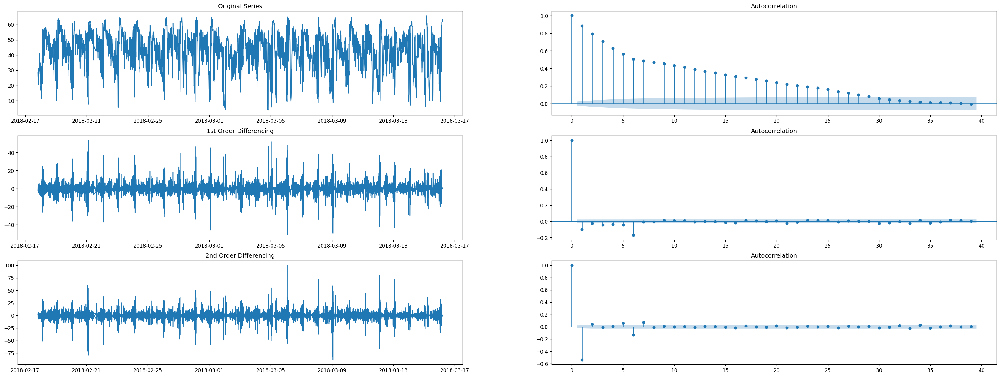

In [46]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(data_204.SPEED); axes[0, 0].set_title('Original Series')
plot_acf(data_204.SPEED, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_204.SPEED.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_204.SPEED.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_204.SPEED.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_204.SPEED.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

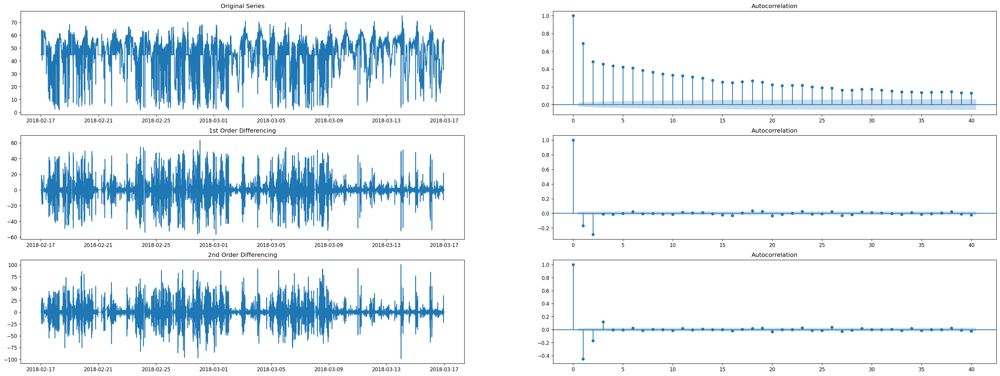

In [47]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(data_205.SPEED); axes[0, 0].set_title('Original Series')
plot_acf(data_205.SPEED, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_205.SPEED.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_205.SPEED.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_205.SPEED.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_205.SPEED.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

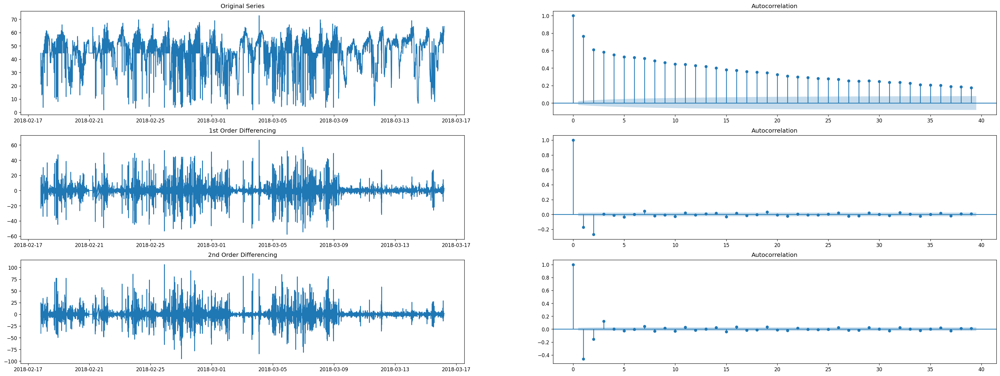

In [48]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(data_206.SPEED); axes[0, 0].set_title('Original Series')
plot_acf(data_206.SPEED, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_206.SPEED.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_206.SPEED.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_206.SPEED.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_206.SPEED.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

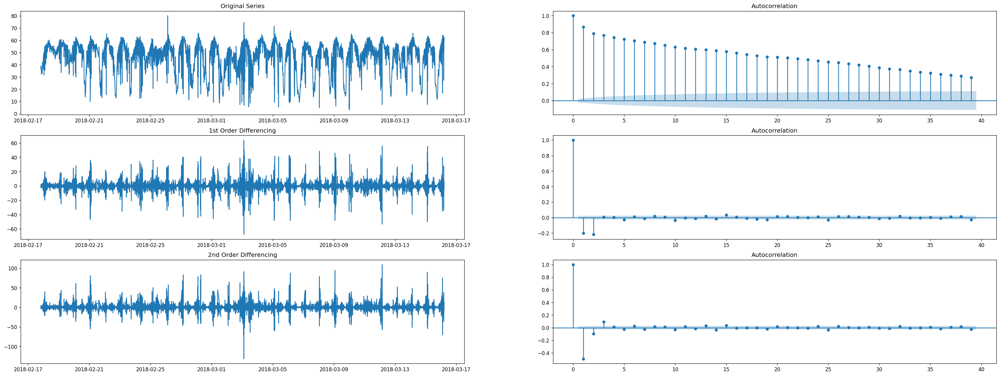

In [49]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(data_207.SPEED); axes[0, 0].set_title('Original Series')
plot_acf(data_207.SPEED, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_207.SPEED.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_207.SPEED.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_207.SPEED.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_207.SPEED.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

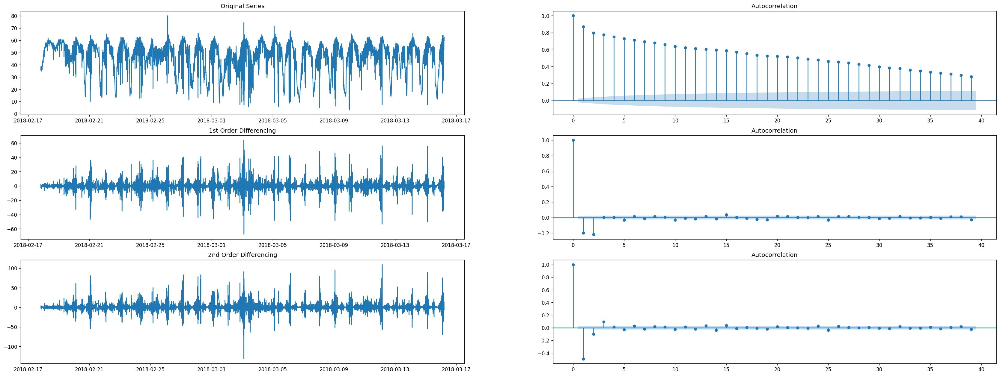

In [50]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(data_208.SPEED); axes[0, 0].set_title('Original Series')
plot_acf(data_208.SPEED, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(data_208.SPEED.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data_208.SPEED.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(data_208.SPEED.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data_208.SPEED.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [51]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
model_204 = pm.auto_arima(data_204.SPEED, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_204.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=47506.902, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=78451.988, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=69339.452, Time=0.33 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=2.75 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=47498.777, Time=0.46 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=63419.321, Time=0.90 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=47496.574, Time=1.46 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=3.40 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=47494.855, Time=2.10 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=47457.502, Time=1.22 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=59094.378, Time=1.33 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=47156.908, Time=0.84 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=49138.720, Time=2.79 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   :

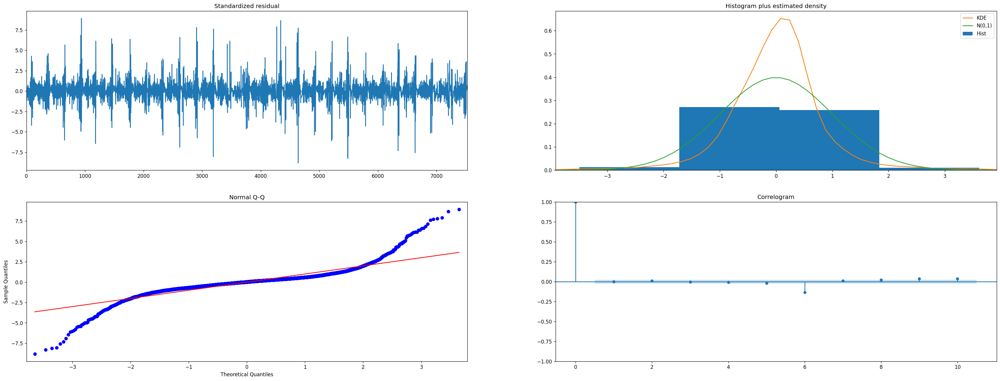

In [52]:
model_204.plot_diagnostics()
plt.show()

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 5389
Model:                     ARMA(2, 0)   Log Likelihood              -16875.382
Method:                       css-mle   S.D. of innovations              5.542
Date:                Sun, 19 Dec 2021   AIC                          33758.763
Time:                        18:34:29   BIC                          33785.132
Sample:                             0   HQIC                         33767.970
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         43.1817      0.639     67.528      0.000      41.928      44.435
ar.L1.y        0.8552      0.014     62.811      0.000       0.828       0.882
ar.L2.y        0.0269      0.014      1.977      0.0

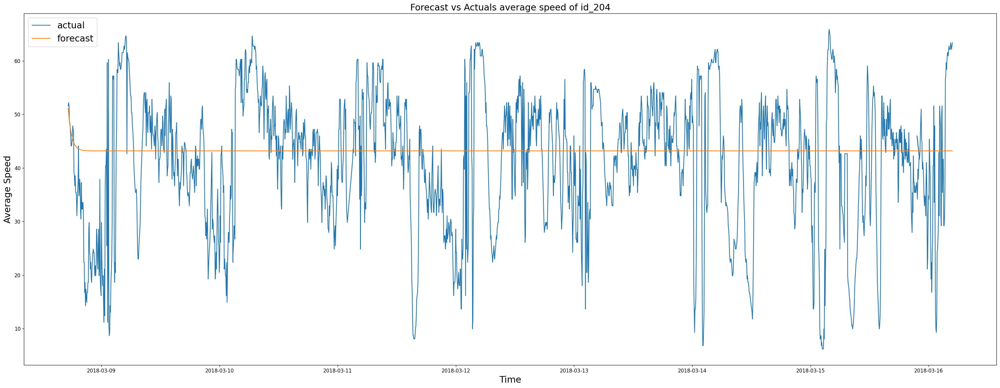

In [92]:
# Build Model
model = ARIMA(train_204, order=(2, 0, 0))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc_204, se_204, conf_204 = fitted.forecast(2141, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series_204 = pd.Series(fc_204, index=data_204[5389:].index)
lower_series = pd.Series(conf_204[:, 0], index=data_204[5389:].index)
upper_series = pd.Series(conf_204[:, 1], index=data_204[5389:].index)

# Plot
#plt.figure(figsize=(12,5), dpi=100)
#plt.plot(train, label='training')
plt.plot(data_204[5389:], label='actual')
plt.plot(fc_series_204, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
                 #color='k', alpha=.15)
plt.title('Forecast vs Actuals average speed of id_204', fontsize=18)
plt.xlabel('Time', fontsize = 18)
plt.ylabel('Average Speed', fontsize = 18)
plt.legend(loc='upper left', fontsize=18)
plt.show()

In [54]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
model_205 = pm.auto_arima(data_205.SPEED, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_205.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59554.381, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=84169.171, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=60236.349, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=75327.887, Time=0.37 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60224.164, Time=1.00 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=58450.256, Time=0.53 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=70576.848, Time=0.71 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=58443.103, Time=0.95 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=58440.969, Time=1.50 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=58499.954, Time=1.97 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=58445.387, Time=2.33 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=58449.991, Time=1.52 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=58319.695, Time=8.11 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=58317.718, Time=6.48 sec
 ARIMA(1,0,2)(0,0,0

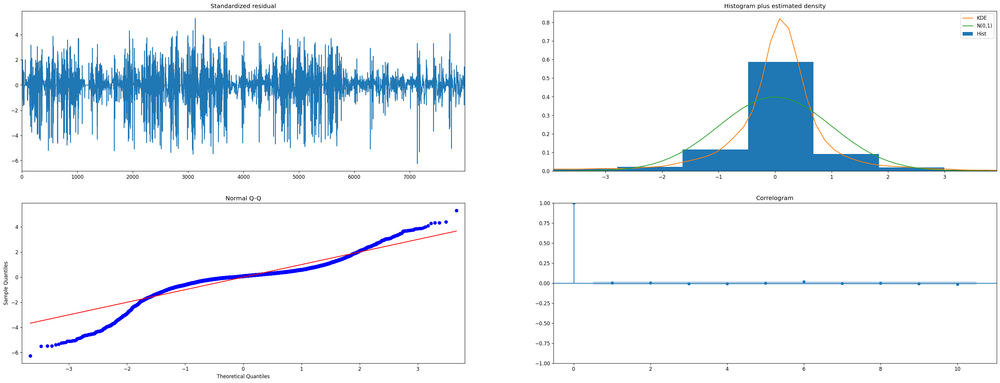

In [55]:
model_205.plot_diagnostics()
plt.show()

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 5389
Model:                     ARMA(2, 0)   Log Likelihood              -16875.382
Method:                       css-mle   S.D. of innovations              5.542
Date:                Sun, 19 Dec 2021   AIC                          33758.763
Time:                        18:35:23   BIC                          33785.132
Sample:                             0   HQIC                         33767.970
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         43.1817      0.639     67.528      0.000      41.928      44.435
ar.L1.y        0.8552      0.014     62.811      0.000       0.828       0.882
ar.L2.y        0.0269      0.014      1.977      0.0

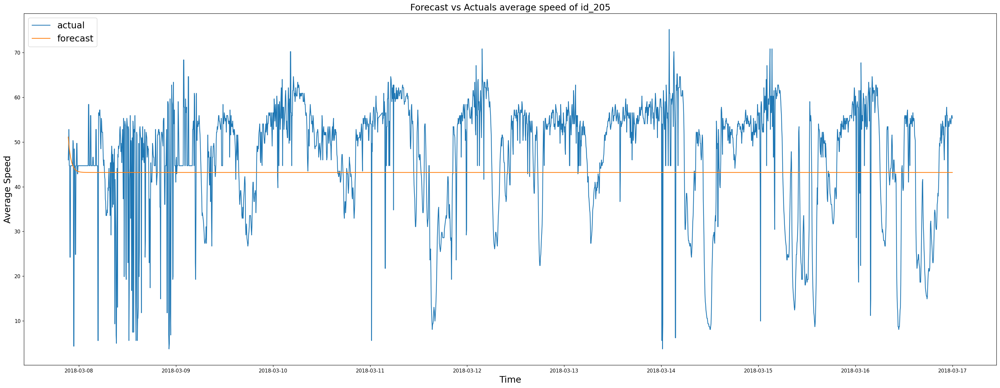

In [94]:
# Build Model
model = ARIMA(train_205, order=(1, 0, 2))  
#fitted = model.fit(disp=1)  
print(fitted.summary())

# Forecast
fc_205, se_205, conf_205 = fitted.forecast(2610, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series_205 = pd.Series(fc_205, index=data_205[5389:].index)
lower_series = pd.Series(conf_205[:, 0], index=data_205[5389:].index)
upper_series = pd.Series(conf_205[:, 1], index=data_205[5389:].index)

# Plot
#plt.figure(figsize=(12,5), dpi=100)
#plt.plot(train, label='training')
plt.plot(data_205[5389:], label='actual')
plt.plot(fc_series_205, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
                 #color='k', alpha=.15)
plt.title('Forecast vs Actuals average speed of id_205', fontsize=18)
plt.xlabel('Time', fontsize = 18)
plt.ylabel('Average Speed', fontsize = 18)
plt.legend(loc='upper left', fontsize=18)
plt.show()

In [57]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
model_206 = pm.auto_arima(data_206.SPEED, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_206.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=52052.335, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=79064.804, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=52635.245, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=70247.971, Time=0.44 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=52623.607, Time=0.85 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=51175.938, Time=0.49 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=64986.447, Time=0.80 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=51166.915, Time=1.69 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=51159.798, Time=1.39 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=51214.636, Time=1.70 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=51162.116, Time=1.87 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=51171.530, Time=1.58 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=51064.629, Time=7.32 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=51065.382, Time=5.39 sec
 ARIMA(3,0,1)(0,0,0

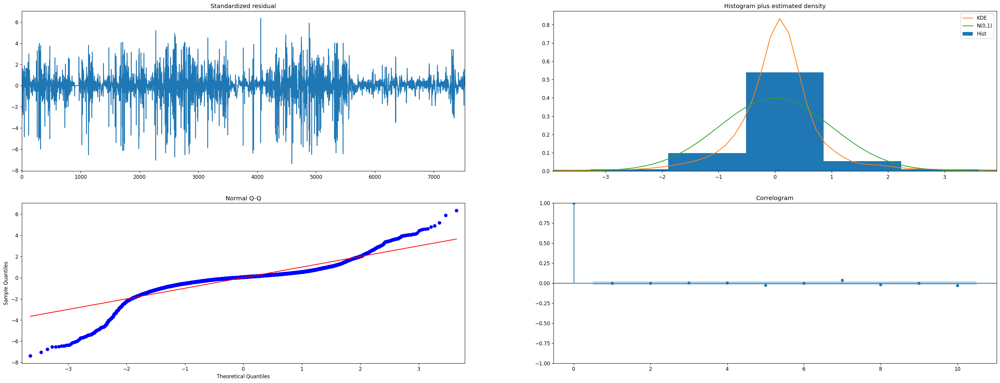

In [58]:
model_206.plot_diagnostics()
plt.show()

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 5389
Model:                     ARMA(2, 0)   Log Likelihood              -16875.382
Method:                       css-mle   S.D. of innovations              5.542
Date:                Sun, 19 Dec 2021   AIC                          33758.763
Time:                        18:36:01   BIC                          33785.132
Sample:                             0   HQIC                         33767.970
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         43.1817      0.639     67.528      0.000      41.928      44.435
ar.L1.y        0.8552      0.014     62.811      0.000       0.828       0.882
ar.L2.y        0.0269      0.014      1.977      0.0

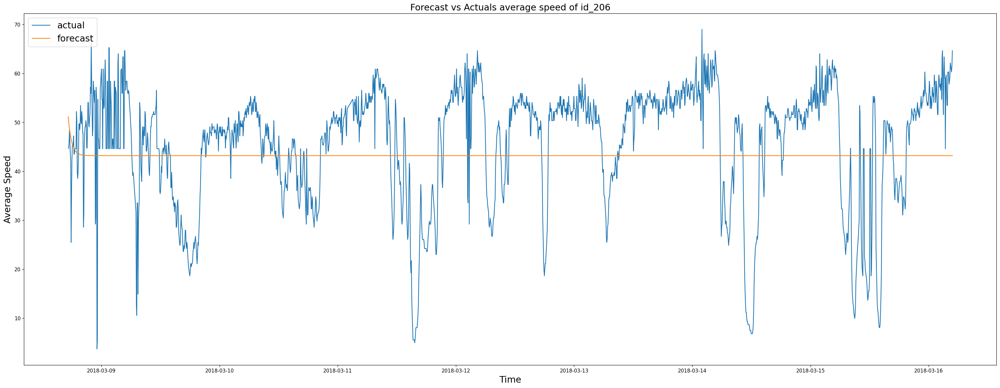

In [95]:
# Build Model
model = ARIMA(train_206, order=(3, 0, 2))  
#fitted = model.fit(disp=1)  
print(fitted.summary())

# Forecast
fc_206, se_206, conf_206 = fitted.forecast(2141, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series_206 = pd.Series(fc_206, index=data_206[5389:].index)
#lower_series = pd.Series(conf[:, 0], index=data_206[5389:].index)
#upper_series = pd.Series(conf[:, 1], index=data_206[5389:].index)

# Plot
#plt.figure(figsize=(12,5), dpi=100)
#plt.plot(train, label='training')
plt.plot(data_206[5389:], label='actual')
plt.plot(fc_series_206, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
                 #color='k', alpha=.15)
plt.title('Forecast vs Actuals average speed of id_206', fontsize = 18)
plt.xlabel('Time', fontsize = 18)
plt.ylabel('Average Speed', fontsize = 18)
plt.legend(loc='upper left', fontsize=18)
plt.show()

In [64]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
model_207 = pm.auto_arima(data_207.SPEED, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_207.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=48742.511, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=79657.553, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=70618.294, Time=0.36 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=48312.342, Time=1.66 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=48267.984, Time=1.69 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=48247.937, Time=1.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=48248.210, Time=1.73 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=48252.060, Time=1.65 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=48250.961, Time=1.17 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=48164.955, Time=5.29 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=48163.266, Time=4.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   :

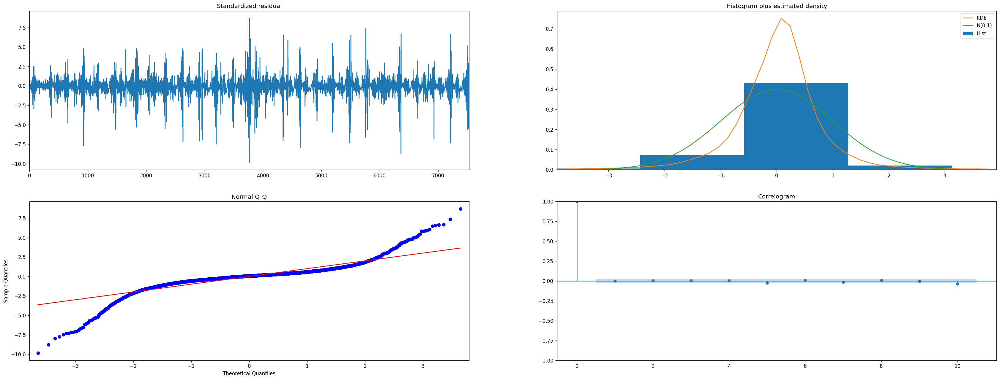

In [65]:
model_207.plot_diagnostics()
plt.show()

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 5389
Model:                     ARMA(2, 0)   Log Likelihood              -16875.382
Method:                       css-mle   S.D. of innovations              5.542
Date:                Sun, 19 Dec 2021   AIC                          33758.763
Time:                        18:36:37   BIC                          33785.132
Sample:                             0   HQIC                         33767.970
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         43.1817      0.639     67.528      0.000      41.928      44.435
ar.L1.y        0.8552      0.014     62.811      0.000       0.828       0.882
ar.L2.y        0.0269      0.014      1.977      0.0

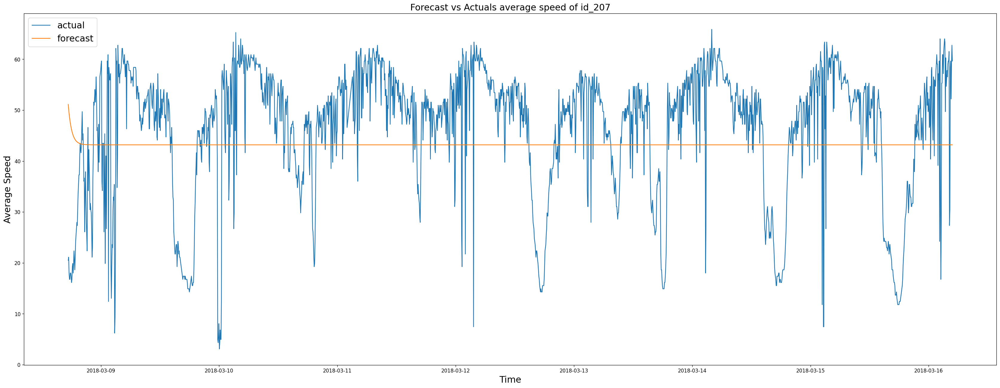

In [96]:
# Build Model
model = ARIMA(train_207, order=(1, 0, 2))  
#fitted = model.fit(disp=1)  
print(fitted.summary())

# Forecast
fc_207, se_207, conf_207 = fitted.forecast(2140, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series_207 = pd.Series(fc_207, index=data_207[5389:].index)
#lower_series = pd.Series(conf[:, 0], index=test_207.index)
#upper_series = pd.Series(conf[:, 1], index=test_207.index)

# Plot
#plt.figure(figsize=(12,5), dpi=100)
#plt.plot(train, label='training')
plt.plot(data_207[5389:], label='actual')
plt.plot(fc_series_207, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
                 #color='k', alpha=.15)
plt.title('Forecast vs Actuals average speed of id_207', fontsize=18)
plt.xlabel('Time', fontsize = 18)
plt.ylabel('Average Speed', fontsize = 18)
plt.legend(loc='upper left', fontsize=18)
plt.show()

In [67]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
model_208 = pm.auto_arima(data_208.SPEED, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_208.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=48623.120, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=79716.999, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=70660.424, Time=0.38 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=48194.354, Time=1.64 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=48149.720, Time=1.59 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=48128.832, Time=2.05 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=48130.062, Time=1.48 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=48133.759, Time=1.69 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=48132.510, Time=1.32 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=48048.296, Time=5.65 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=48046.561, Time=3.51 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   :

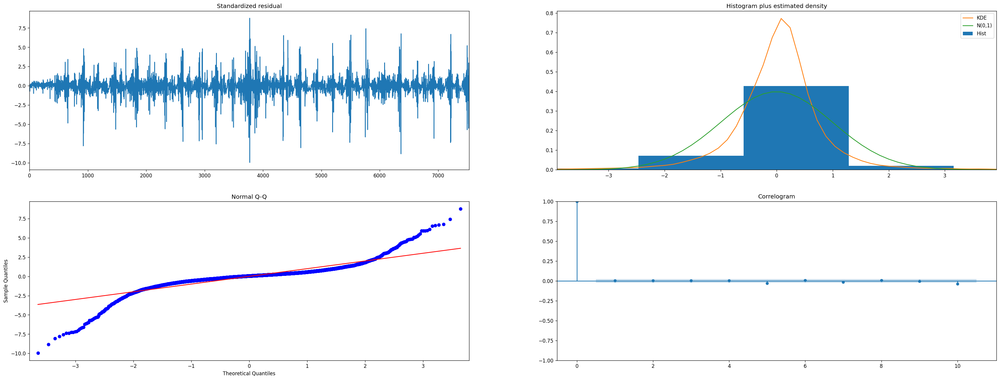

In [68]:
model_208.plot_diagnostics()
plt.show()

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 5389
Model:                     ARMA(2, 0)   Log Likelihood              -16875.382
Method:                       css-mle   S.D. of innovations              5.542
Date:                Sun, 19 Dec 2021   AIC                          33758.763
Time:                        18:37:13   BIC                          33785.132
Sample:                             0   HQIC                         33767.970
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         43.1817      0.639     67.528      0.000      41.928      44.435
ar.L1.y        0.8552      0.014     62.811      0.000       0.828       0.882
ar.L2.y        0.0269      0.014      1.977      0.0

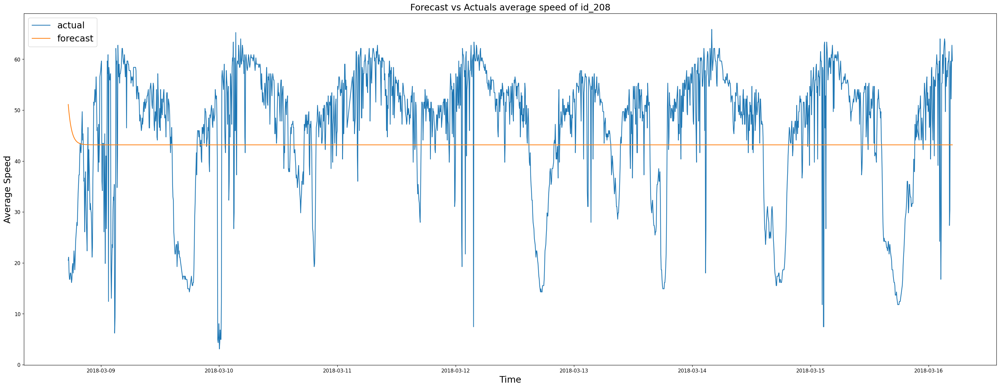

In [97]:
# Build Model
model = ARIMA(train_208, order=(1, 0, 2))  
#fitted = model.fit(disp=1)  
print(fitted.summary())

# Forecast
fc_208, se_208, conf_208 = fitted.forecast(2140, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series_208 = pd.Series(fc_208, index=data_208[5389:].index)
#lower_series = pd.Series(conf_208[:, 0], index=test_208.index)
#upper_series = pd.Series(conf_208[:, 1], index=test_208.index)

# Plot
#plt.figure(figsize=(12,5), dpi=100)
#plt.plot(train, label='training')
plt.plot(data_208[5389:], label='actual')
plt.plot(fc_series_208, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
                 #color='k', alpha=.15)
plt.title('Forecast vs Actuals average speed of id_208', fontsize = 18)
plt.xlabel('Time', fontsize = 18)
plt.ylabel('Average Speed', fontsize = 18)
plt.legend(loc='upper left', fontsize=18)
plt.show()

In [70]:
# Accuracy metrics
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    acf1 = acf(forecast-actual)[1]                      # ACF1
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'acf1':acf1, 
            'corr':corr, 'minmax':minmax})

In [71]:
forecast_accuracy(fc_204, test_204)

{'mape': 0.3699546501151159,
 'me': 1.9712778309873362,
 'mae': 9.860141575526773,
 'mpe': 0.22579709429783795,
 'rmse': 12.62397509735996,
 'acf1': 0.8953513447894907,
 'corr': 0.034783333453765275,
 'minmax': 0.20904241615193464}

In [72]:
forecast_accuracy(fc_205, test_205)

{'mape': 0.37228150975349106,
 'me': -3.398832391351961,
 'mae': 11.183158794375554,
 'mpe': 0.11085110030370593,
 'rmse': 13.287814445711081,
 'acf1': 0.8262919245439299,
 'corr': -0.026585753360968314,
 'minmax': 0.2207738249303508}

In [73]:
forecast_accuracy(fc_206, test_206)

{'mape': 0.3443035302119449,
 'me': -2.4583599395800095,
 'mae': 10.271945270017865,
 'mpe': 0.11020255764379279,
 'rmse': 12.292578126983049,
 'acf1': 0.9413062386278904,
 'corr': -0.013657071383347584,
 'minmax': 0.20745997482061684}

In [74]:
forecast_accuracy(fc_207, test_207)

{'mape': 0.35908900475095334,
 'me': -3.037490472420001,
 'mae': 11.177726886184125,
 'mpe': 0.10107352683327135,
 'rmse': 13.23183222445639,
 'acf1': 0.8725816512674807,
 'corr': -0.17900671070617835,
 'minmax': 0.22283556569373397}

In [75]:
forecast_accuracy(fc_208, test_208)

{'mape': 0.3590989073299623,
 'me': -3.037984434069888,
 'mae': 11.17822084783401,
 'mpe': 0.10106362425426246,
 'rmse': 13.231952785868536,
 'acf1': 0.8726175513229314,
 'corr': -0.17901002254008852,
 'minmax': 0.22284546827274299}